In [2]:
import torch
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data_transform = transforms.Compose([transforms.ToTensor()])

In [3]:
train_dataset = datasets.ImageFolder(root='./data/train/', transform=data_transform)

In [4]:
dataset_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)

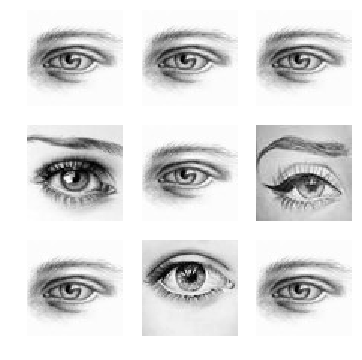

In [6]:
%matplotlib inline
first_batch, _ = next(iter(dataset_loader))  # retrieve the first batch
fig = plt.figure(figsize=(12, 6))
for row in range(1, 4):  # show 3 rows
    for col in range(1, 4):  # show 3 columns
        index = 6 * (row - 1) + col
        image = first_batch[index - 1, 0, :]  # retrieve images as (28, 28) tensors
        fig.add_subplot(3, 6, index)
        plt.imshow(image.numpy(), cmap='gray')
        plt.axis('off')
plt.show()

In [3]:
from torchsummary import summary
import torch 
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F

In [8]:
!pip install torchsummary

You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [4]:
class Generator(nn.Module):
    
    def __init__(self):
        super(Generator,self).__init__()
        self.DCV1 = nn.ConvTranspose2d(in_channels=100, out_channels=512, kernel_size=4, stride=1, padding=0)
        self.BN1  = nn.BatchNorm2d(512)
        self.DCV2 = nn.ConvTranspose2d(512, 256, 4, 2, 1)
        self.BN2  = nn.BatchNorm2d(256)
        self.DCV3 = nn.ConvTranspose2d(256, 128, 4, 2, 1)
        self.BN3  = nn.BatchNorm2d(128)
        self.DCV4 = nn.ConvTranspose2d(128, 64, 4, 2, 1)
        self.BN4  = nn.BatchNorm2d(64)
        self.DCV5 = nn.ConvTranspose2d(64, 3, 4, 2, 1)
        
    def forward(self, inputs):
        '''
        input size: (batch_size, 100, 1, 1)
        outputs size: (batch_size, 1, 64, 64)
        ''' 
        """ori=inputs[0][0].data.numpy()
        print ('original : ',ori.shape)
        plt.imshow(ori, cmap=plt.get_cmap('gray'))
        plt.show(),
        """        
        # Deconv 1
        x = self.DCV1(inputs)
        x = self.BN1(x)
        x = F.leaky_relu(x, negative_slope=0.2)
        """intm=x[0][0].data.numpy()
        print (' Gen conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Deconv 2
        x = self.DCV2(x)
        x = self.BN2(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Deconv 3
        x = self.DCV3(x)
        x = self.BN3(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Deconv 4
        x = self.DCV4(x)
        x = self.BN4(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('Gen conv 4: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Deconv 5 + output
        x = self.DCV5(x)
        outputs = F.tanh(x)
        return outputs

In [5]:
class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator,self).__init__()
        self.CV1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1)
        self.CV2 = nn.Conv2d(64, 128, 4, 2, 1)
        self.BN2 = nn.BatchNorm2d(num_features=128)
        self.CV3 = nn.Conv2d(128, 256, 4, 2, 1)
        self.BN3 = nn.BatchNorm2d(256)
        self.CV4 = nn.Conv2d(256, 512, 4, 2, 1)
        self.BN4 = nn.BatchNorm2d(512)
        self.CV5 = nn.Conv2d(512, 1, 4)

    def forward(self, inputs):
        '''
        input size: (batch_size, 3, 64, 64)
        outputs size: (batch_size, 1)
        '''
        """ori=inputs[0][0].data.numpy()
        print ('original : ',ori.shape)
        plt.imshow(ori, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Conv 1
        x = self.CV1(inputs)
        x = F.leaky_relu(x, negative_slope=0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Conv 2
        x = self.CV2(x)
        x = self.BN2(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Conv 3
        x = self.CV3(x)
        x = self.BN3(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Conv 4
        x = self.CV4(x)
        x = self.BN4(x)
        x = F.leaky_relu(x, 0.2)
        """intm=x[0][0].data.numpy()
        print ('conv 2: ',intm.shape)
        imgplot = plt.imshow(intm)
        plt.imshow(intm, cmap=plt.get_cmap('gray'))
        plt.show(),"""
        
        # Conv 5 + output
        x = self.CV5(x)
        outputs = F.sigmoid(x) # at this point outputs has size (batch_size, 1, 1, 1) need to resize!
        outputs = outputs.view(-1, 1)  # resize to (batch_size, 1)
        return outputs

In [13]:
# def model
G = Generator()#.cuda()
D = Discriminator()#.cuda()

# def Adam optimizer
G_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002)
D_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002)

# loss
criterion = nn.BCELoss()

In [14]:
print(summary(D, (3, 64, 64)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]            3136
            Conv2d-2          [-1, 128, 16, 16]          131200
       BatchNorm2d-3          [-1, 128, 16, 16]             256
            Conv2d-4            [-1, 256, 8, 8]          524544
       BatchNorm2d-5            [-1, 256, 8, 8]             512
            Conv2d-6            [-1, 512, 4, 4]         2097664
       BatchNorm2d-7            [-1, 512, 4, 4]            1024
            Conv2d-8              [-1, 1, 1, 1]            8193
Total params: 2766529
Trainable params: 2766529
Non-trainable params: 0
----------------------------------------------------------------
None


In [15]:
print(summary(G, (100, 64, 64)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1          [-1, 512, 67, 67]          819712
       BatchNorm2d-2          [-1, 512, 67, 67]            1024
   ConvTranspose2d-3        [-1, 256, 134, 134]         2097408
       BatchNorm2d-4        [-1, 256, 134, 134]             512
   ConvTranspose2d-5        [-1, 128, 268, 268]          524416
       BatchNorm2d-6        [-1, 128, 268, 268]             256
   ConvTranspose2d-7         [-1, 64, 536, 536]          131136
       BatchNorm2d-8         [-1, 64, 536, 536]             128
   ConvTranspose2d-9        [-1, 3, 1072, 1072]            3075
Total params: 3577667
Trainable params: 3577667
Non-trainable params: 0
----------------------------------------------------------------
None


In [16]:
batch_size = 16
# label tensors to compute BCE loss
#real_labels = Variable(torch.ones(real_images.size()[0], 1))
#fake_labels = Variable(torch.zeros(real_images.size()[0], 1))
#print (real_labels, fake_labels)

In [17]:
def train_D(real_images, real_labels, fake_labels):
    # sample real images from dataset, wrap in Variable
    real_images = Variable(real_images)

    # sample fake images from generator
    noise = Variable(torch.randn(real_images.size()[0], 100, 1, 1))
    fake_images = G.forward(noise)

    # forward prop
    real_outputs = D.forward(real_images)
    fake_outputs = D.forward(fake_images)

    # D optimizer grad
    D_optimizer.zero_grad()

    # loss formula , backprop and update params
    D_loss = criterion(real_outputs, real_labels) + criterion(fake_outputs, fake_labels)
    # backprop
    D_loss.backward()
    # update params
    D_optimizer.step()
    
    return D_loss.data[0]  # return the loss of this minibatch

In [18]:
def train_G(real_labels, fake_labels):
    # sample fake images
    noise = Variable(torch.randn(real_labels.size()[0], 100, 1, 1))
    fake_images = G.forward(noise)

    # foward prop
    fake_outputs = D.forward(fake_images)

    # G optimizer grad
    G_optimizer.zero_grad()
            
    # loss formaula
    G_loss = criterion(fake_outputs, real_labels)
    # backprop  
    G_loss.backward()
    # update params
    G_optimizer.step()
    
    return G_loss.data[0]

In [19]:
# use to evaluate model: see how fake images improve over the epochs
def plot_fake_images(rows, cols):
    # generate (rows * cols) fake images
    noise = Variable(torch.randn(rows * cols, 100, 1, 1))
    fake_images = G.forward(noise)
    
    fig = plt.figure(figsize=(2 * cols, 2 * rows))
    for row in range(1, rows + 1):
        for col in range(1, cols + 1):
            index = cols * (row - 1) + col
            image = fake_images[index - 1, 0, :, :]  # get images as dim tensors

            fig.add_subplot(rows, cols, index)
            plt.imshow(image.data.numpy(), cmap='gray')
            plt.axis('off')
        
    plt.show()
    return

In [28]:
epoch_max=200
def train(epoch_max, batch_size):
    # logger recording the average batch loss per each epoch
    G_log = []
    D_log = []
    
    for epoch in range(epoch_max):
        # logger recording the losses for each minibatch in this epoch
        G_batch_loss = []
        D_batch_loss = []
        
        for batch, (real_images, _) in enumerate(dataset_loader):  # enumerate through minibatches
            
            #print('mini-batch : ' + str(batch))
            # generate labels to min-batch_size
            real_labels = Variable(torch.ones(real_images.size()[0], 1))
            fake_labels = Variable(torch.zeros(real_images.size()[0], 1))
            
            # train discriminator
            D_loss = train_D(real_images, real_labels, fake_labels)
            
            # train generator
            G_loss = train_G(real_labels, fake_labels)
        
            # add batch losses to logger
            D_batch_loss.append(D_loss)
            G_batch_loss.append(G_loss)
            
        # compute average loss of this epoch
        G_log.append(sum(G_batch_loss) / len(G_batch_loss))
        D_log.append(sum(D_batch_loss) / len(D_batch_loss))
        
        # for selected epochs, show 5 generated images
        #epoch_list = [0, 1, 2, 4, 7, 12, 19]
        #if epoch in epoch_list:
        print('Epoch %d, G_loss: %.3f, D_loss = %.3f' % \
              (epoch , G_log[epoch], D_log[epoch]))
        plot_fake_images(1, 6)

    return G_log, D_log

Epoch 0, G_loss: 5.639, D_loss = 0.019


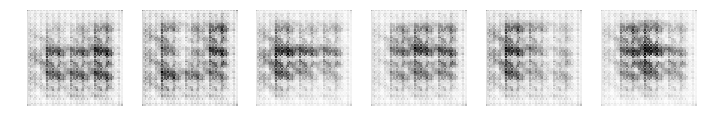

Epoch 1, G_loss: 6.244, D_loss = 0.023


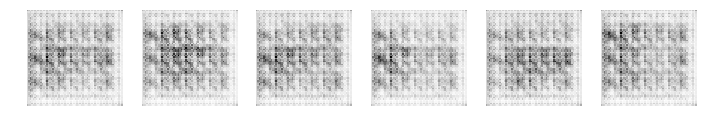

Epoch 2, G_loss: 5.761, D_loss = 0.070


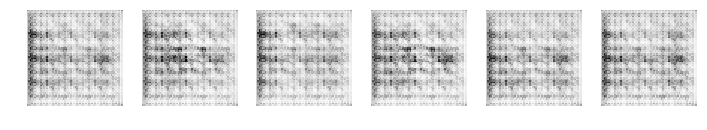

Epoch 3, G_loss: 6.688, D_loss = 0.027


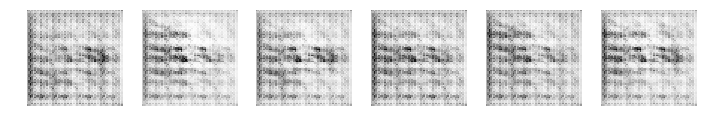

Epoch 4, G_loss: 6.609, D_loss = 0.034


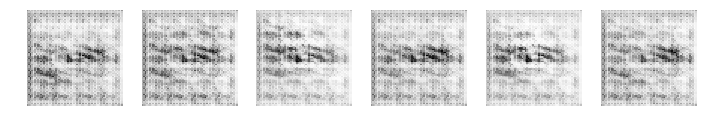

Epoch 5, G_loss: 5.391, D_loss = 0.054


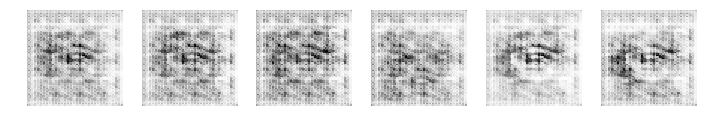

Epoch 6, G_loss: 6.424, D_loss = 0.035


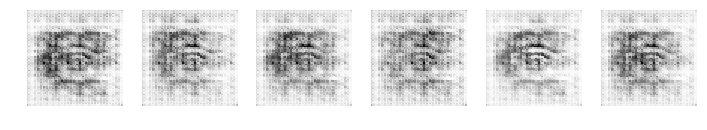

Epoch 7, G_loss: 5.443, D_loss = 0.082


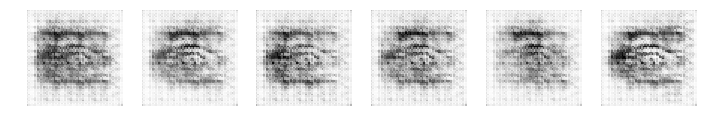

Epoch 8, G_loss: 8.693, D_loss = 0.066


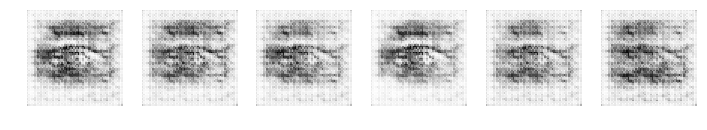

Epoch 9, G_loss: 6.760, D_loss = 0.117


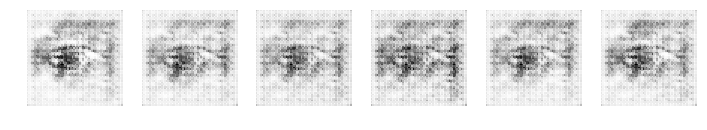

Epoch 10, G_loss: 7.317, D_loss = 0.064


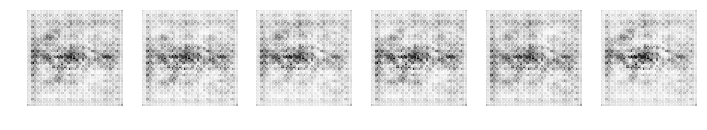

Epoch 11, G_loss: 6.575, D_loss = 0.030


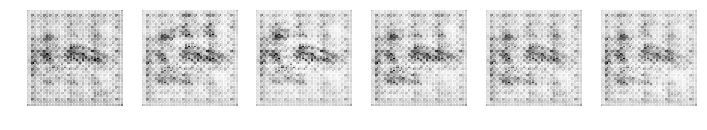

Epoch 12, G_loss: 6.883, D_loss = 0.104


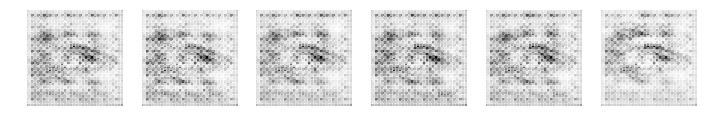

Epoch 13, G_loss: 7.091, D_loss = 0.037


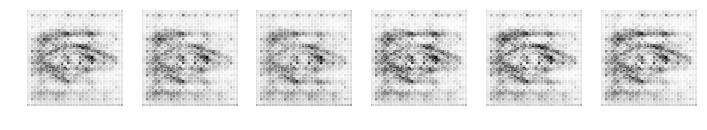

Epoch 14, G_loss: 5.784, D_loss = 0.086


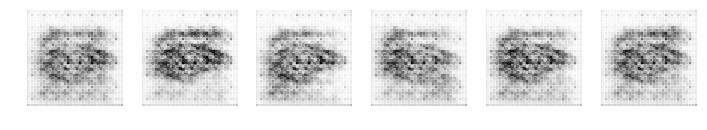

Epoch 15, G_loss: 6.671, D_loss = 0.108


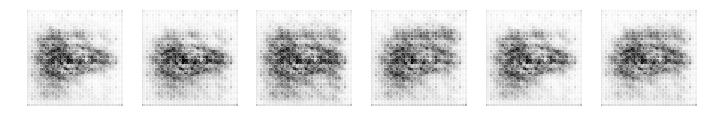

Epoch 16, G_loss: 7.588, D_loss = 0.083


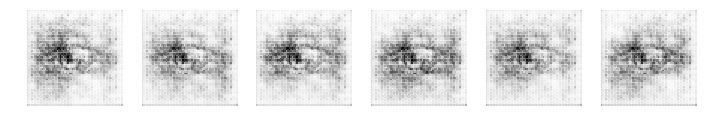

Epoch 17, G_loss: 8.424, D_loss = 0.084


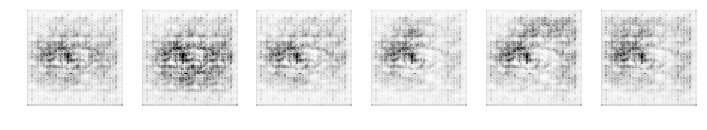

Epoch 18, G_loss: 6.457, D_loss = 0.033


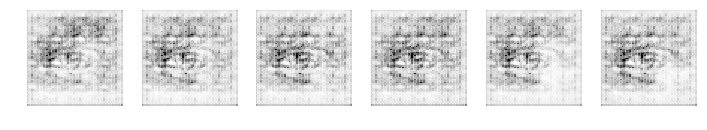

Epoch 19, G_loss: 6.546, D_loss = 0.048


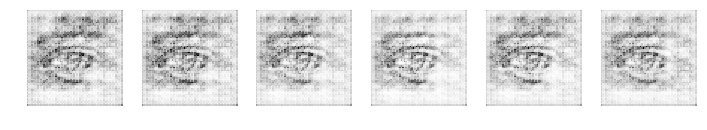

Epoch 20, G_loss: 5.841, D_loss = 0.102


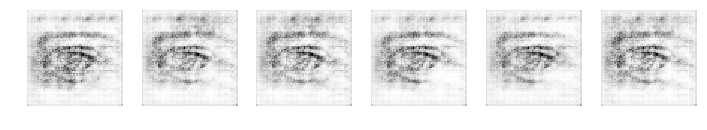

Epoch 21, G_loss: 7.614, D_loss = 0.060


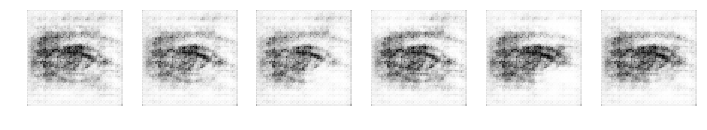

Epoch 22, G_loss: 10.055, D_loss = 0.080


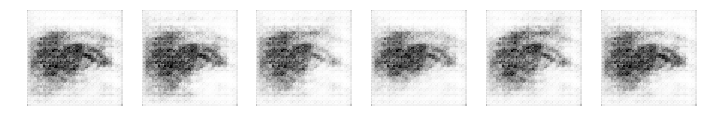

Epoch 23, G_loss: 6.278, D_loss = 0.106


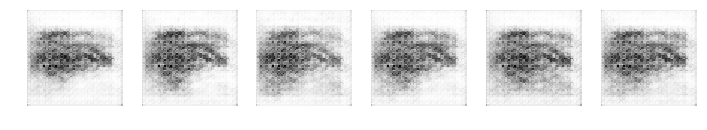

Epoch 24, G_loss: 10.874, D_loss = 0.183


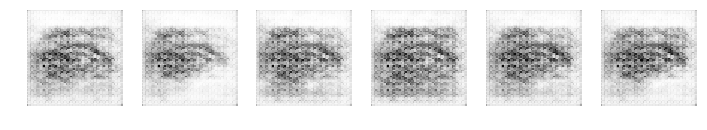

Epoch 25, G_loss: 6.487, D_loss = 0.050


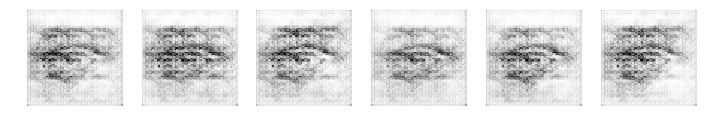

Epoch 26, G_loss: 7.484, D_loss = 0.050


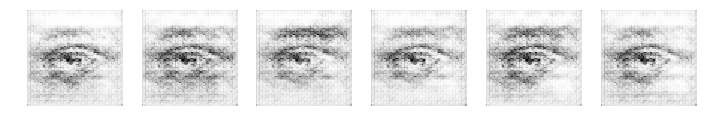

Epoch 27, G_loss: 5.659, D_loss = 0.075


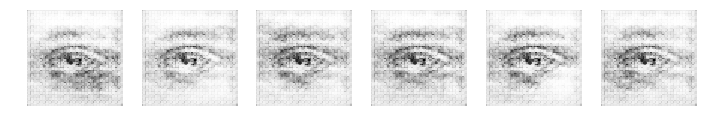

Epoch 28, G_loss: 5.475, D_loss = 0.077


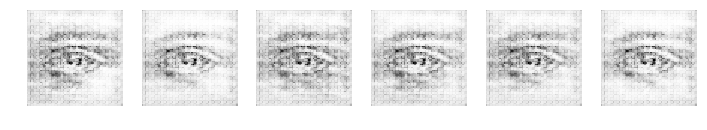

Epoch 29, G_loss: 6.696, D_loss = 0.031


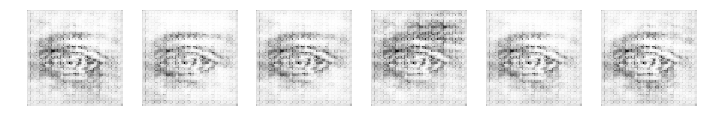

Epoch 30, G_loss: 4.978, D_loss = 0.107


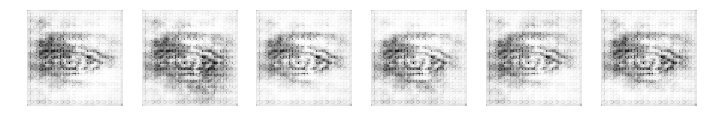

Epoch 31, G_loss: 6.773, D_loss = 0.043


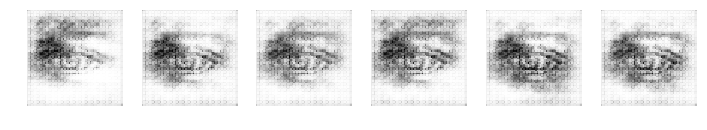

Epoch 32, G_loss: 5.914, D_loss = 0.065


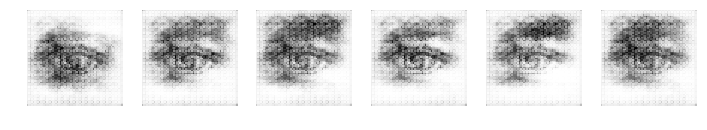

Epoch 33, G_loss: 6.237, D_loss = 0.078


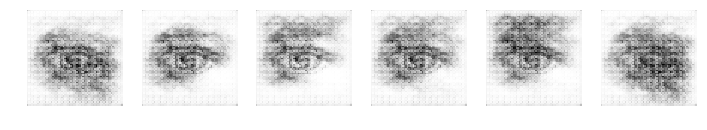

Epoch 34, G_loss: 5.969, D_loss = 0.045


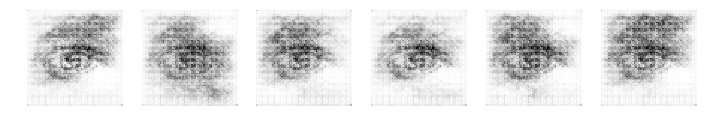

Epoch 35, G_loss: 5.193, D_loss = 0.063


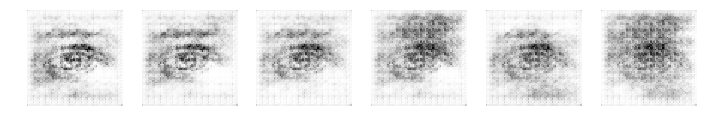

Epoch 36, G_loss: 6.622, D_loss = 0.054


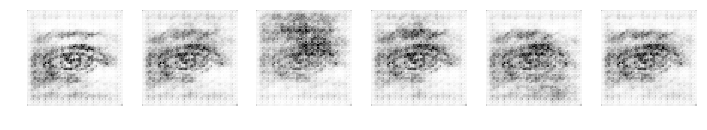

Epoch 37, G_loss: 6.073, D_loss = 0.129


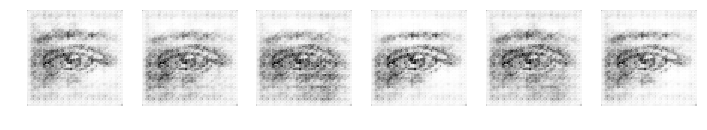

Epoch 38, G_loss: 8.025, D_loss = 0.448


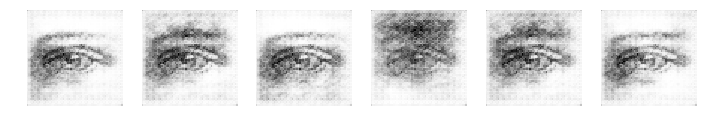

Epoch 39, G_loss: 6.867, D_loss = 0.194


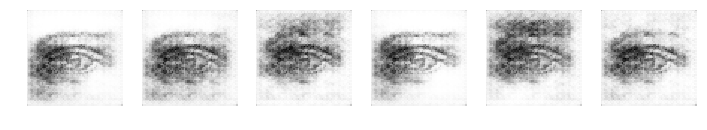

Epoch 40, G_loss: 4.737, D_loss = 0.053


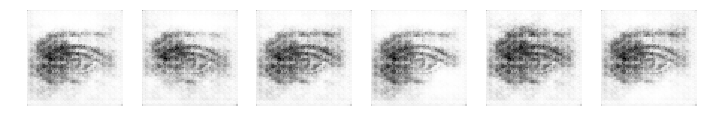

Epoch 41, G_loss: 5.639, D_loss = 0.059


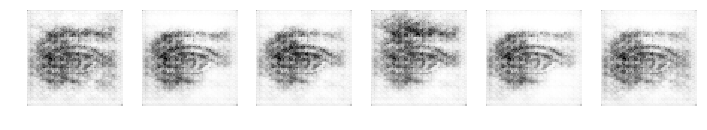

Epoch 42, G_loss: 5.179, D_loss = 0.140


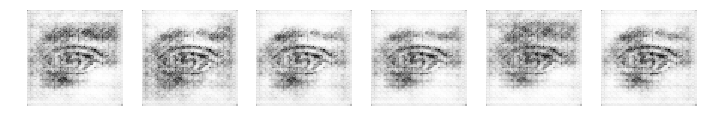

Epoch 43, G_loss: 6.064, D_loss = 0.072


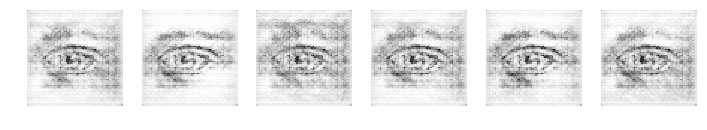

Epoch 44, G_loss: 5.985, D_loss = 0.070


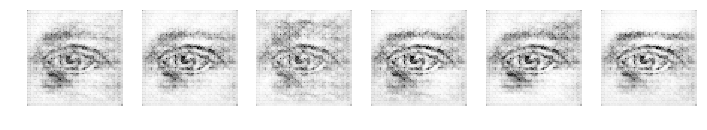

Epoch 45, G_loss: 6.740, D_loss = 0.089


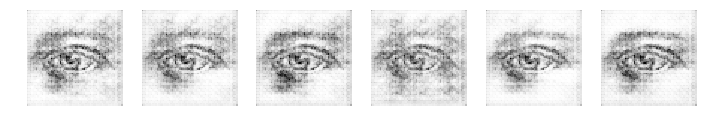

Epoch 46, G_loss: 7.360, D_loss = 0.143


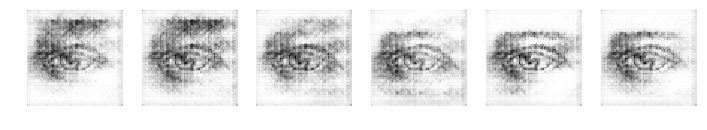

Epoch 47, G_loss: 6.171, D_loss = 0.086


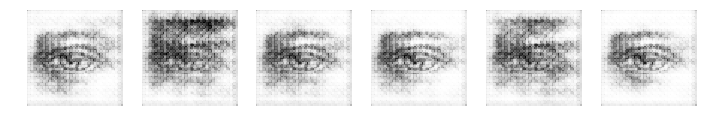

Epoch 48, G_loss: 5.329, D_loss = 0.045


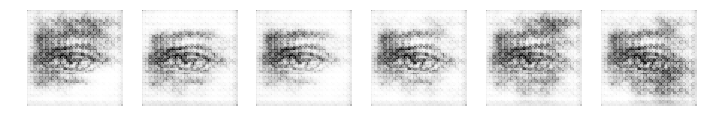

Epoch 49, G_loss: 5.715, D_loss = 0.105


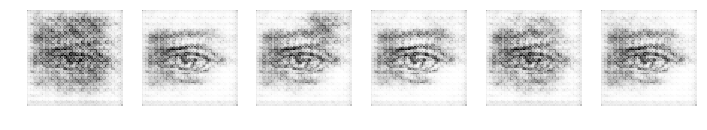

Epoch 50, G_loss: 6.360, D_loss = 0.300


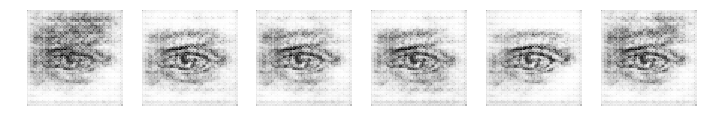

Epoch 51, G_loss: 11.878, D_loss = 0.377


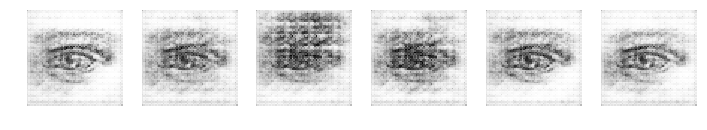

Epoch 52, G_loss: 9.245, D_loss = 0.006


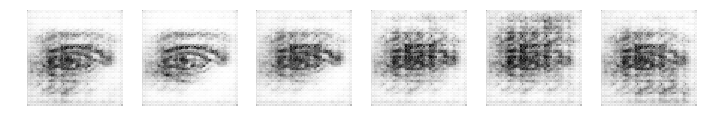

Epoch 53, G_loss: 4.552, D_loss = 0.069


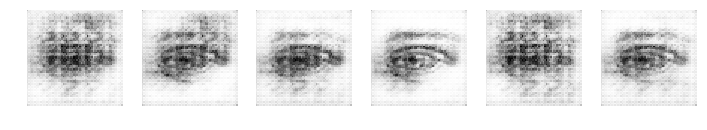

Epoch 54, G_loss: 5.090, D_loss = 0.158


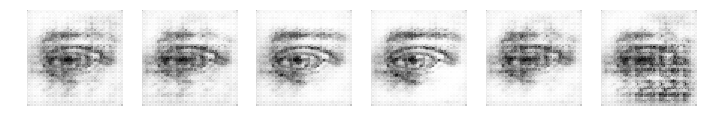

Epoch 55, G_loss: 4.343, D_loss = 0.092


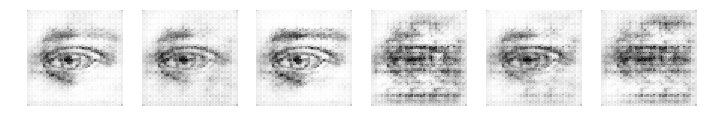

Epoch 56, G_loss: 5.223, D_loss = 0.137


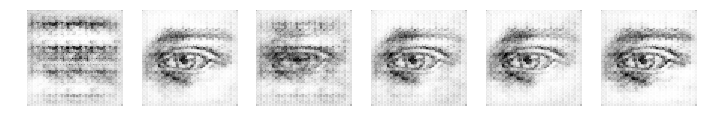

Epoch 57, G_loss: 6.448, D_loss = 0.209


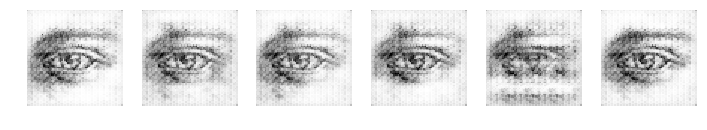

Epoch 58, G_loss: 7.533, D_loss = 0.059


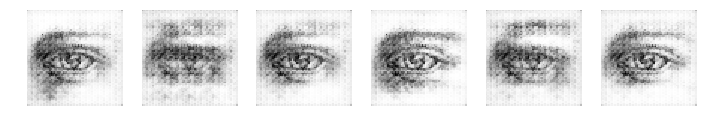

Epoch 59, G_loss: 6.157, D_loss = 0.120


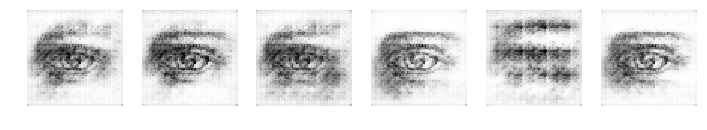

Epoch 60, G_loss: 5.501, D_loss = 0.091


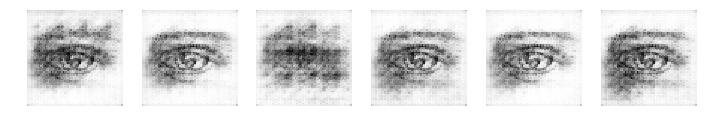

Epoch 61, G_loss: 6.833, D_loss = 0.508


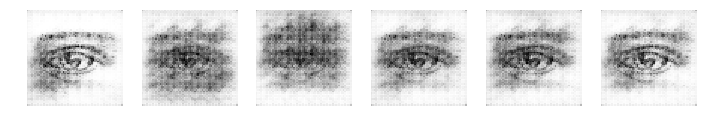

Epoch 62, G_loss: 6.018, D_loss = 0.062


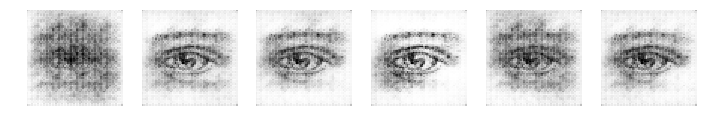

Epoch 63, G_loss: 5.790, D_loss = 0.151


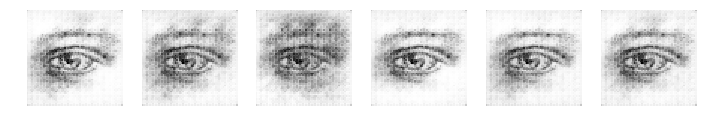

Epoch 64, G_loss: 5.199, D_loss = 0.155


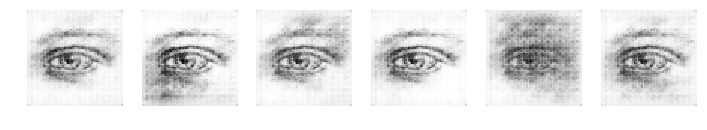

Epoch 65, G_loss: 5.487, D_loss = 0.240


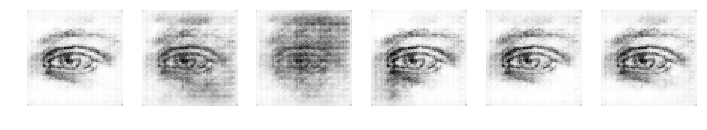

Epoch 66, G_loss: 6.320, D_loss = 0.256


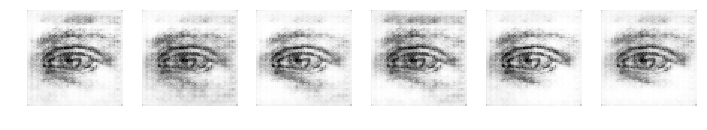

Epoch 67, G_loss: 10.199, D_loss = 0.149


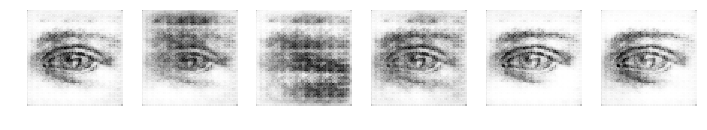

Epoch 68, G_loss: 7.028, D_loss = 0.079


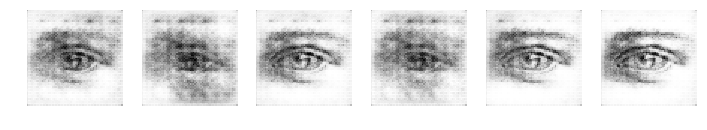

Epoch 69, G_loss: 5.875, D_loss = 0.105


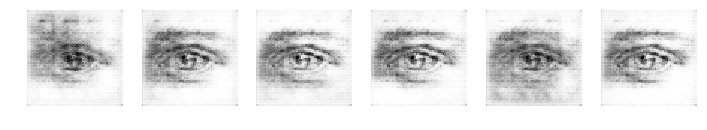

Epoch 70, G_loss: 5.377, D_loss = 0.119


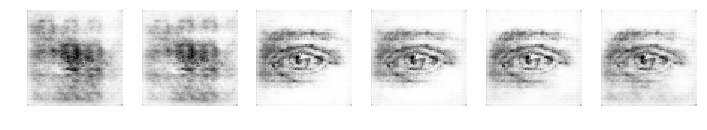

Epoch 71, G_loss: 4.984, D_loss = 0.176


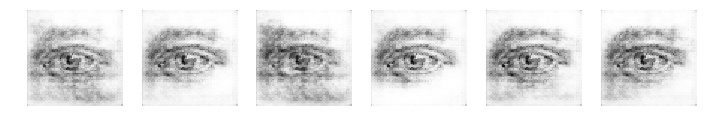

Epoch 72, G_loss: 6.095, D_loss = 0.326


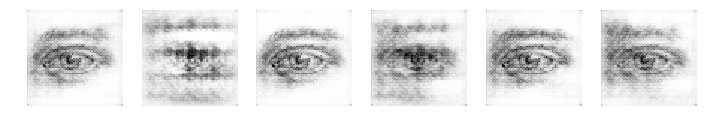

Epoch 73, G_loss: 6.576, D_loss = 0.194


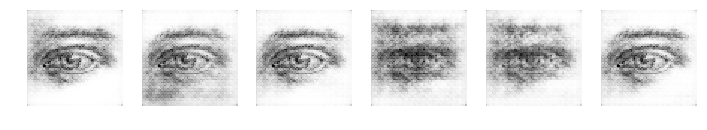

Epoch 74, G_loss: 9.112, D_loss = 0.047


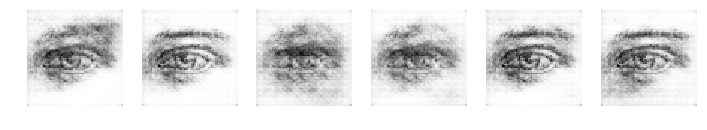

Epoch 75, G_loss: 5.506, D_loss = 0.107


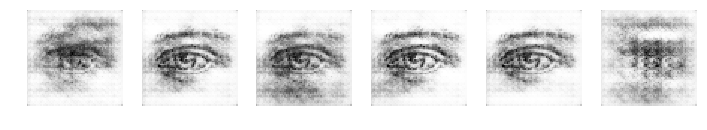

Epoch 76, G_loss: 5.448, D_loss = 0.119


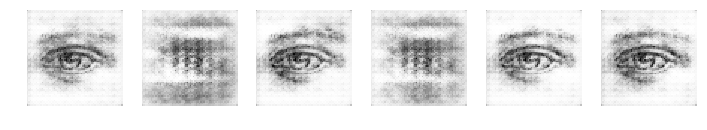

Epoch 77, G_loss: 5.142, D_loss = 0.272


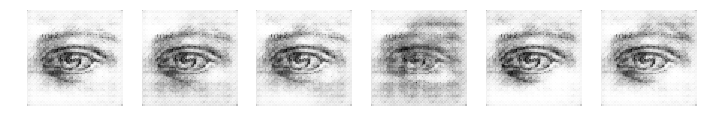

Epoch 78, G_loss: 8.785, D_loss = 0.384


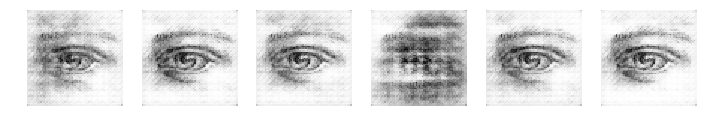

Epoch 79, G_loss: 5.618, D_loss = 0.091


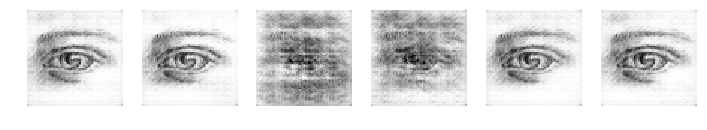

Epoch 80, G_loss: 5.298, D_loss = 0.197


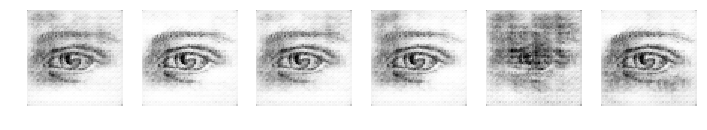

Epoch 81, G_loss: 4.730, D_loss = 0.111


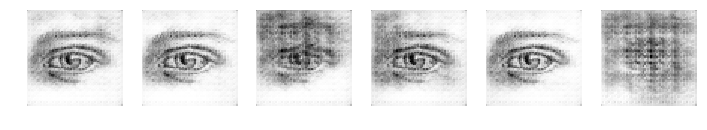

Epoch 82, G_loss: 5.269, D_loss = 0.245


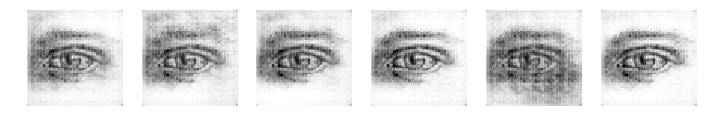

Epoch 83, G_loss: 6.106, D_loss = 0.172


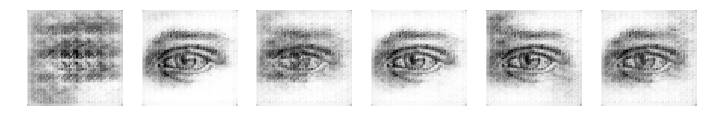

Epoch 84, G_loss: 8.229, D_loss = 0.061


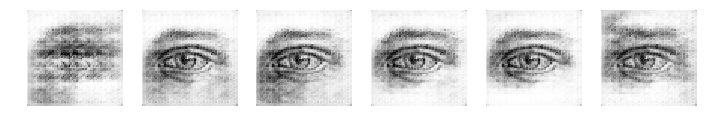

Epoch 85, G_loss: 5.796, D_loss = 0.333


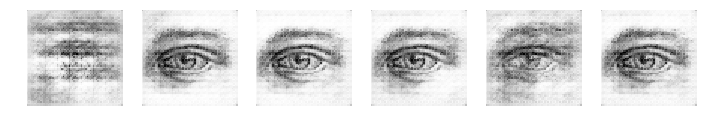

Epoch 86, G_loss: 7.552, D_loss = 0.149


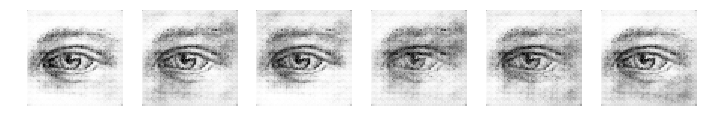

Epoch 87, G_loss: 5.485, D_loss = 0.144


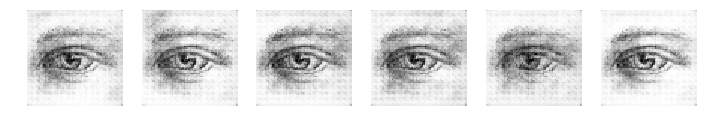

Epoch 88, G_loss: 5.791, D_loss = 0.189


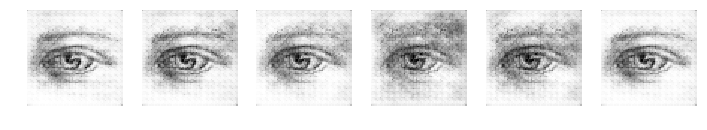

Epoch 89, G_loss: 7.921, D_loss = 0.117


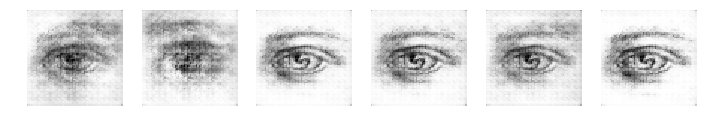

Epoch 90, G_loss: 4.808, D_loss = 0.129


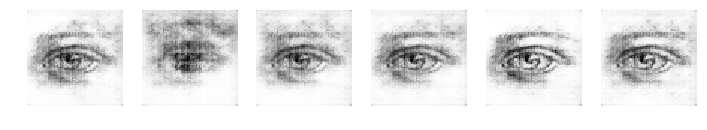

Epoch 91, G_loss: 5.495, D_loss = 0.399


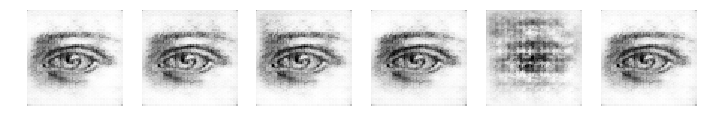

Epoch 92, G_loss: 6.287, D_loss = 0.078


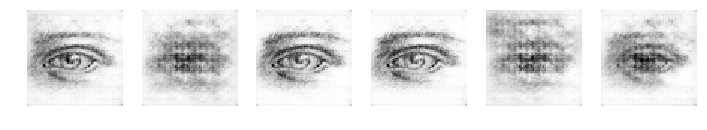

Epoch 93, G_loss: 4.608, D_loss = 0.144


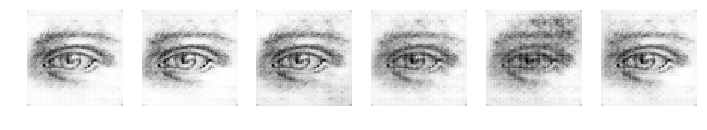

Epoch 94, G_loss: 7.896, D_loss = 0.328


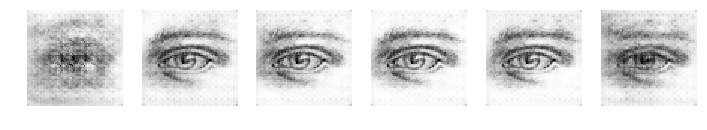

Epoch 95, G_loss: 6.941, D_loss = 0.321


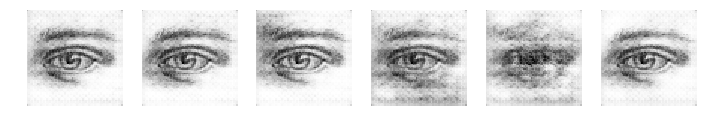

Epoch 96, G_loss: 5.351, D_loss = 0.133


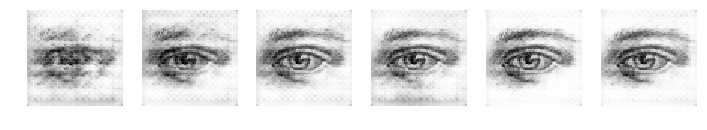

Epoch 97, G_loss: 4.812, D_loss = 0.146


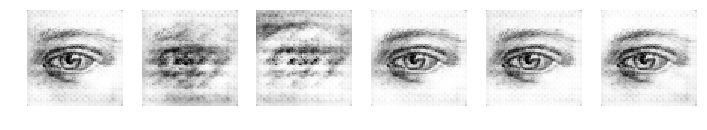

Epoch 98, G_loss: 5.190, D_loss = 0.111


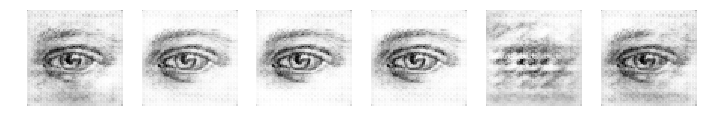

Epoch 99, G_loss: 5.268, D_loss = 0.207


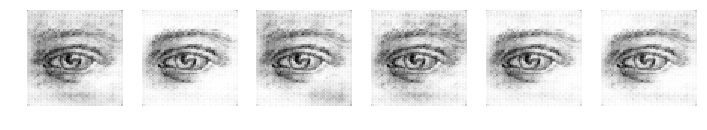

Epoch 100, G_loss: 8.515, D_loss = 0.255


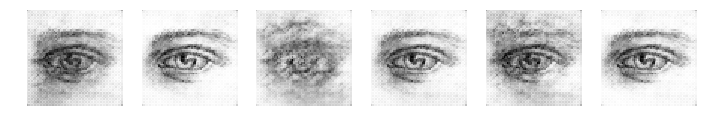

Epoch 101, G_loss: 6.391, D_loss = 0.485


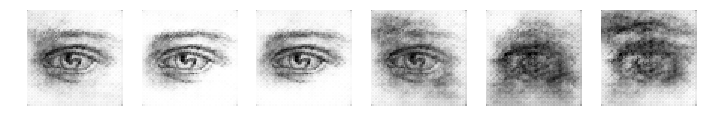

Epoch 102, G_loss: 5.036, D_loss = 0.232


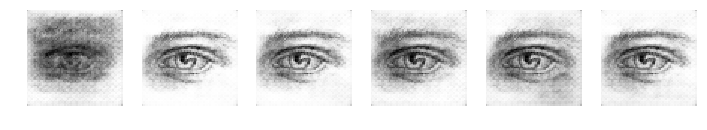

Epoch 103, G_loss: 6.357, D_loss = 0.427


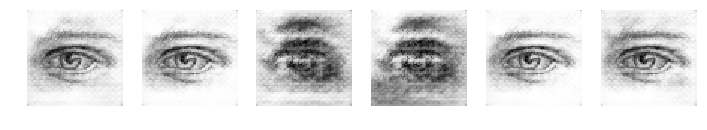

Epoch 104, G_loss: 7.396, D_loss = 0.244


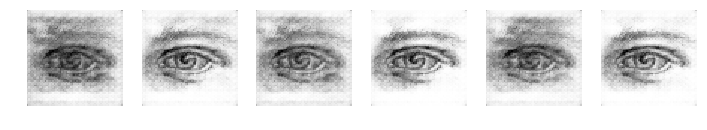

Epoch 105, G_loss: 6.007, D_loss = 0.076


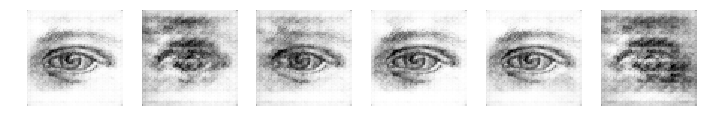

Epoch 106, G_loss: 4.541, D_loss = 0.220


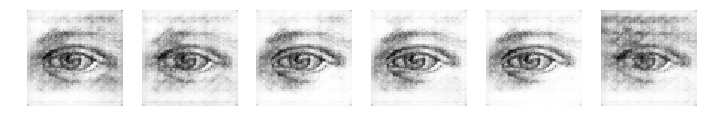

Epoch 107, G_loss: 5.386, D_loss = 0.422


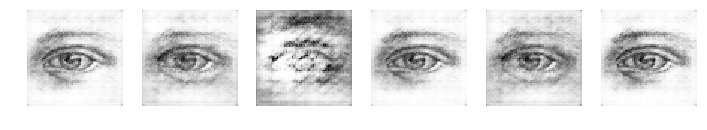

Epoch 108, G_loss: 6.809, D_loss = 0.440


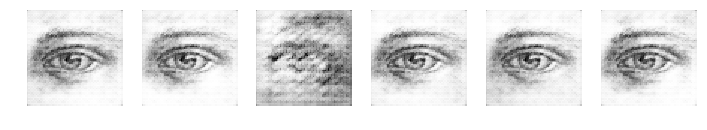

Epoch 109, G_loss: 5.918, D_loss = 0.099


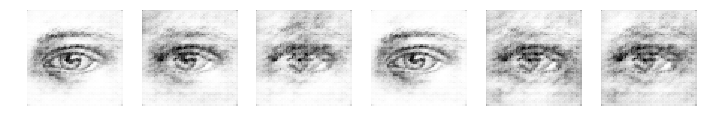

Epoch 110, G_loss: 4.895, D_loss = 0.370


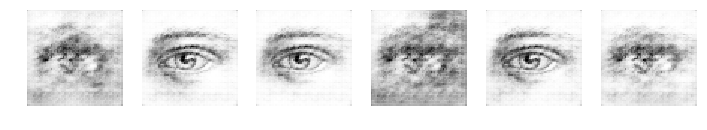

Epoch 111, G_loss: 7.555, D_loss = 0.236


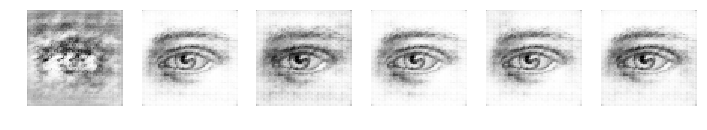

Epoch 112, G_loss: 6.291, D_loss = 0.428


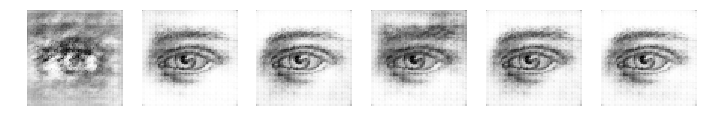

Epoch 113, G_loss: 6.750, D_loss = 0.356


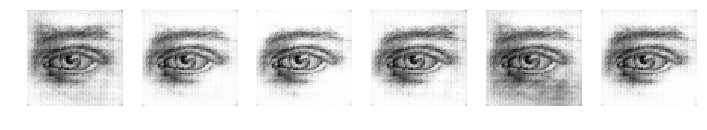

Epoch 114, G_loss: 6.729, D_loss = 0.062


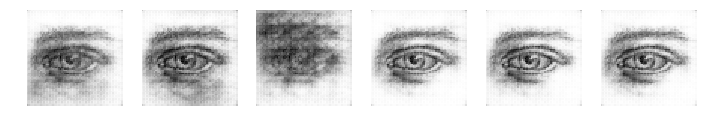

Epoch 115, G_loss: 7.589, D_loss = 0.328


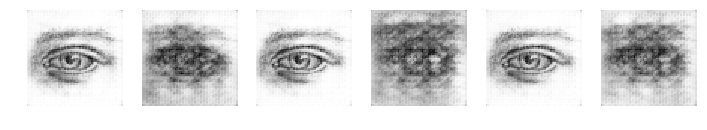

Epoch 116, G_loss: 6.250, D_loss = 0.494


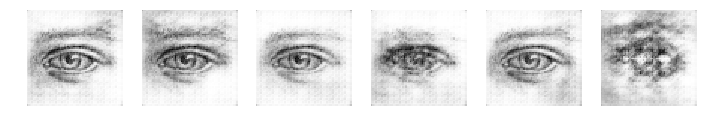

Epoch 117, G_loss: 6.235, D_loss = 0.146


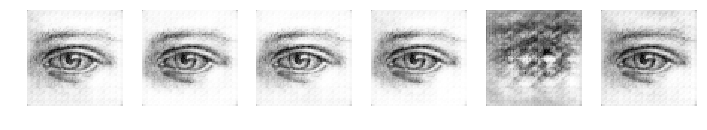

Epoch 118, G_loss: 3.852, D_loss = 0.145


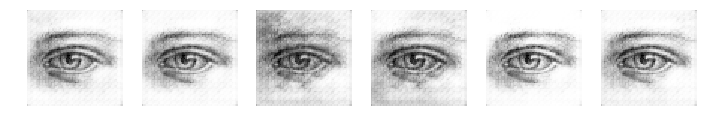

Epoch 119, G_loss: 4.342, D_loss = 0.224


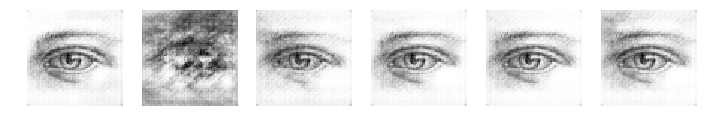

Epoch 120, G_loss: 4.235, D_loss = 0.205


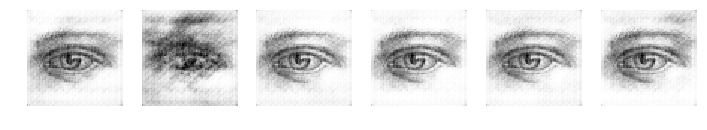

Epoch 121, G_loss: 5.323, D_loss = 0.120


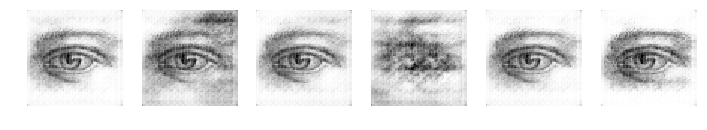

Epoch 122, G_loss: 4.254, D_loss = 0.169


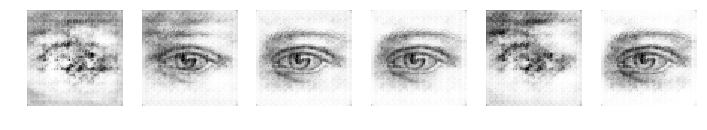

Epoch 123, G_loss: 5.188, D_loss = 0.266


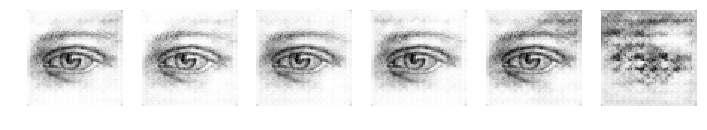

Epoch 124, G_loss: 4.793, D_loss = 0.162


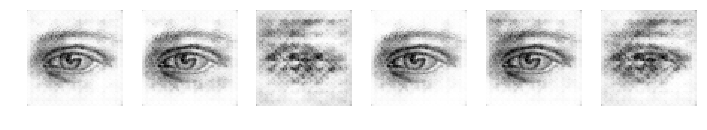

Epoch 125, G_loss: 5.735, D_loss = 0.100


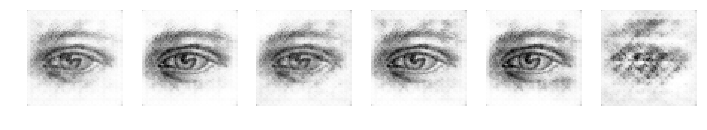

Epoch 126, G_loss: 3.817, D_loss = 0.208


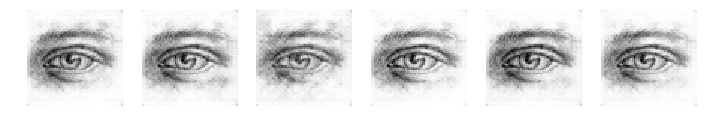

Epoch 127, G_loss: 4.887, D_loss = 0.373


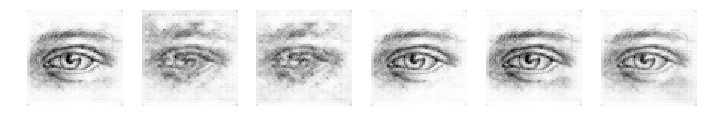

Epoch 128, G_loss: 6.762, D_loss = 0.392


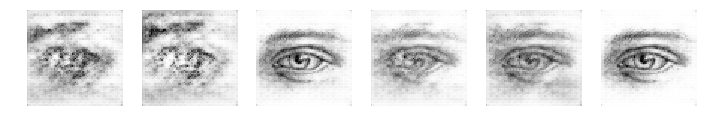

Epoch 129, G_loss: 5.844, D_loss = 0.149


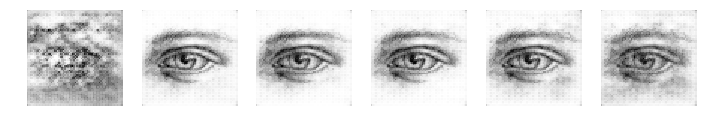

Epoch 130, G_loss: 5.659, D_loss = 0.166


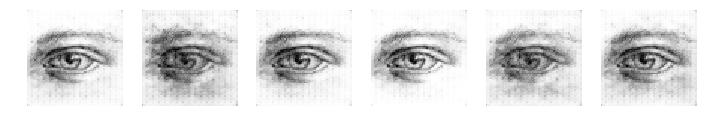

Epoch 131, G_loss: 5.737, D_loss = 0.405


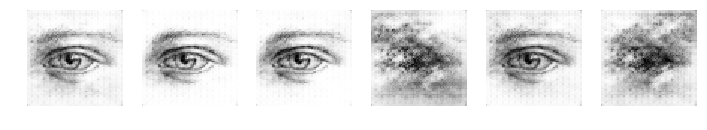

Epoch 132, G_loss: 5.384, D_loss = 0.329


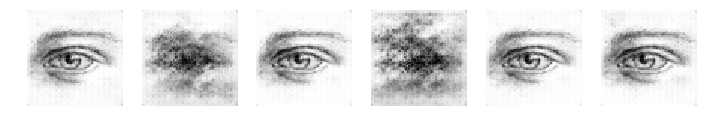

Epoch 133, G_loss: 6.217, D_loss = 0.386


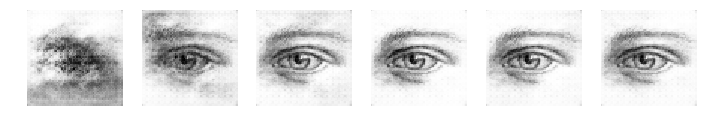

Epoch 134, G_loss: 4.768, D_loss = 0.117


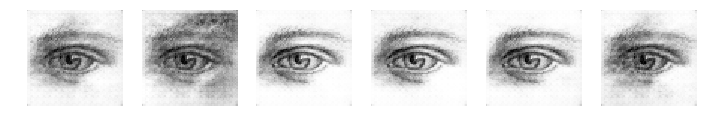

Epoch 135, G_loss: 3.579, D_loss = 0.317


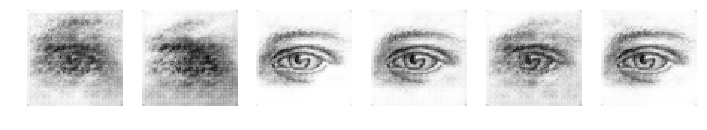

Epoch 136, G_loss: 5.207, D_loss = 0.157


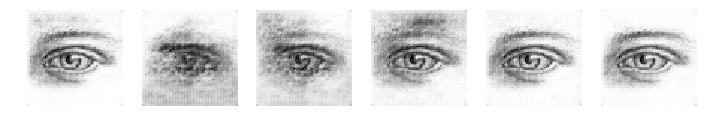

Epoch 137, G_loss: 4.735, D_loss = 0.263


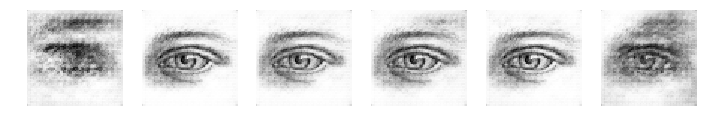

Epoch 138, G_loss: 4.524, D_loss = 0.343


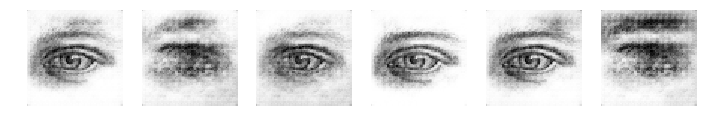

Epoch 139, G_loss: 6.093, D_loss = 0.091


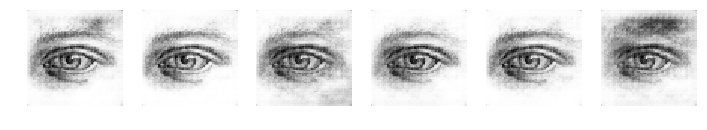

Epoch 140, G_loss: 4.184, D_loss = 0.214


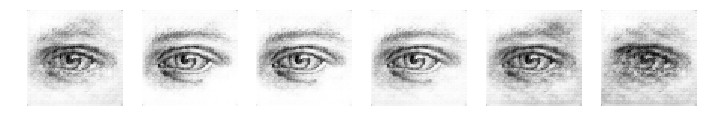

Epoch 141, G_loss: 4.983, D_loss = 0.115


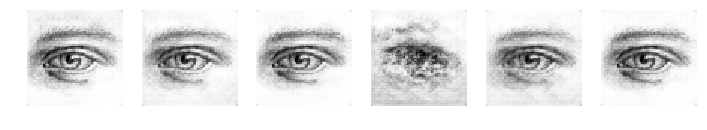

Epoch 142, G_loss: 4.258, D_loss = 0.259


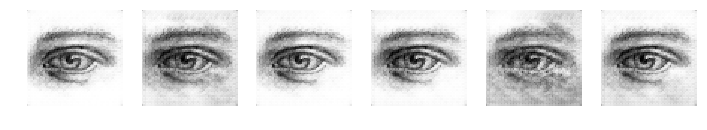

Epoch 143, G_loss: 5.821, D_loss = 0.065


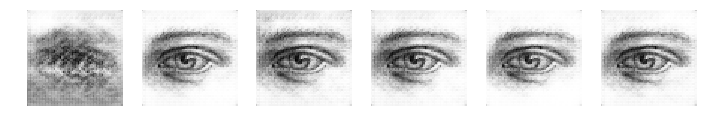

Epoch 144, G_loss: 4.058, D_loss = 0.382


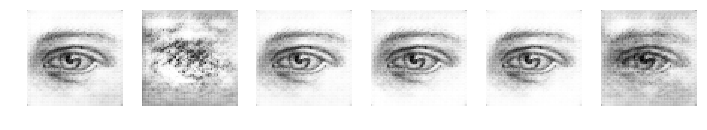

Epoch 145, G_loss: 6.033, D_loss = 0.067


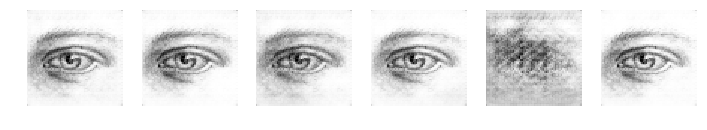

Epoch 146, G_loss: 4.382, D_loss = 0.252


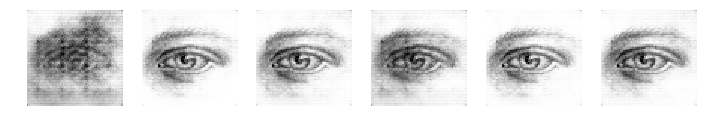

Epoch 147, G_loss: 5.637, D_loss = 0.250


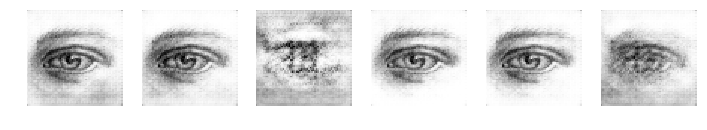

Epoch 148, G_loss: 5.039, D_loss = 0.203


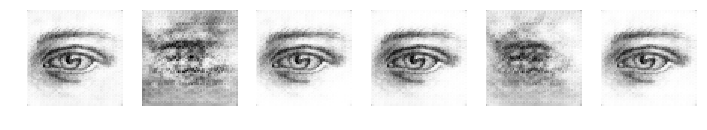

Epoch 149, G_loss: 6.263, D_loss = 0.985


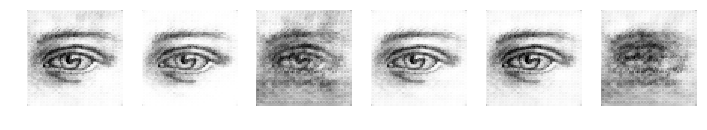

Epoch 150, G_loss: 5.010, D_loss = 0.391


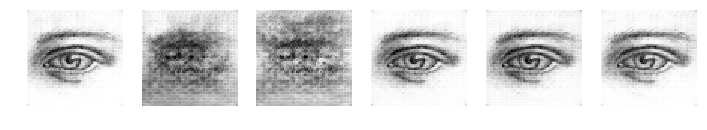

Epoch 151, G_loss: 6.826, D_loss = 0.903


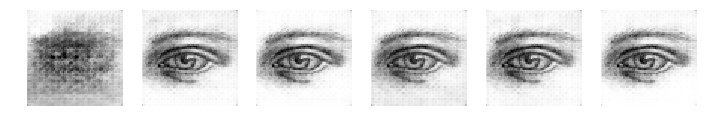

Epoch 152, G_loss: 6.341, D_loss = 0.209


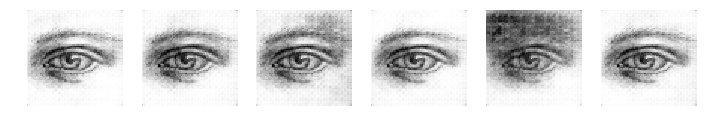

Epoch 153, G_loss: 4.361, D_loss = 0.283


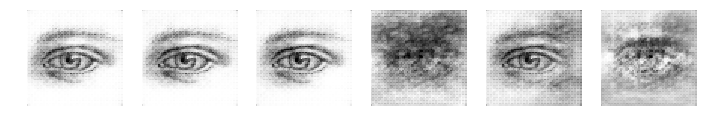

Epoch 154, G_loss: 4.098, D_loss = 0.229


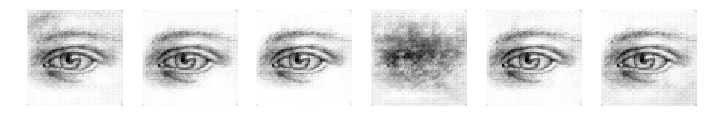

Epoch 155, G_loss: 4.986, D_loss = 0.235


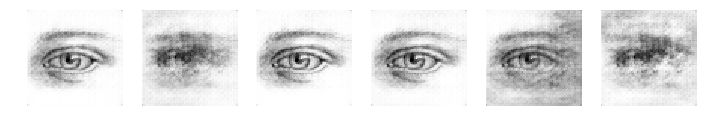

Epoch 156, G_loss: 4.752, D_loss = 0.587


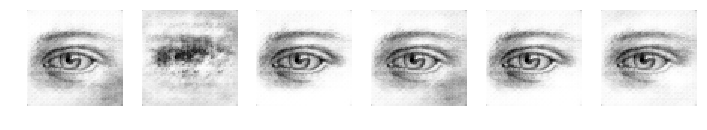

Epoch 157, G_loss: 4.388, D_loss = 0.578


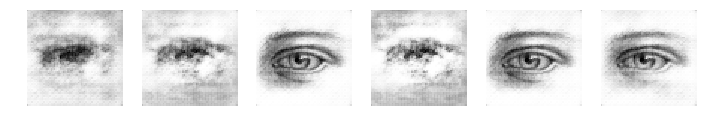

Epoch 158, G_loss: 4.550, D_loss = 0.233


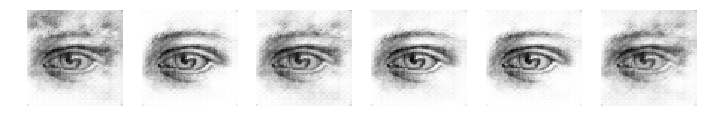

Epoch 159, G_loss: 4.686, D_loss = 0.304


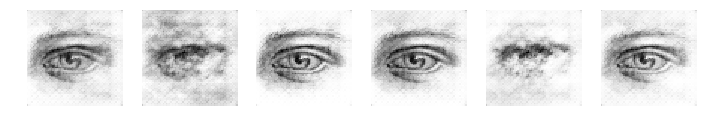

Epoch 160, G_loss: 5.784, D_loss = 0.250


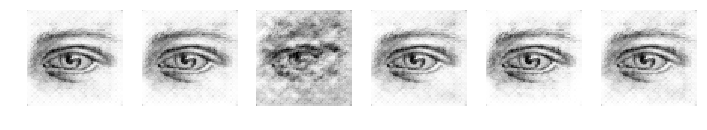

Epoch 161, G_loss: 4.394, D_loss = 0.203


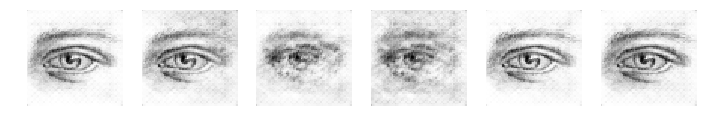

Epoch 162, G_loss: 5.129, D_loss = 0.403


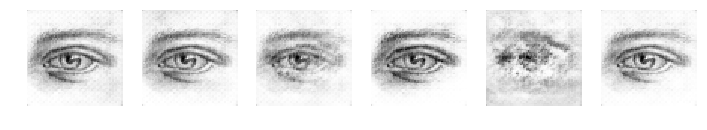

Epoch 163, G_loss: 3.422, D_loss = 0.443


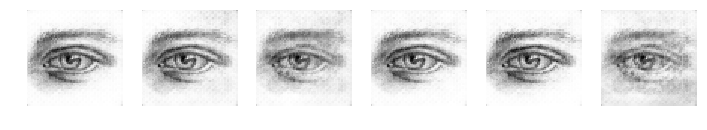

Epoch 164, G_loss: 6.290, D_loss = 0.254


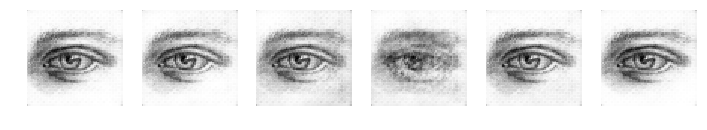

Epoch 165, G_loss: 6.021, D_loss = 0.336


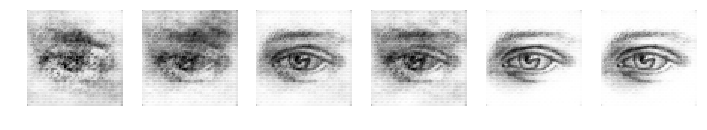

Epoch 166, G_loss: 5.319, D_loss = 0.260


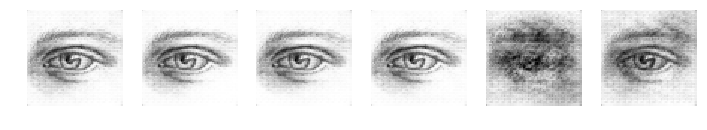

Epoch 167, G_loss: 5.010, D_loss = 0.201


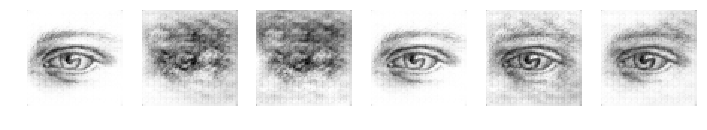

Epoch 168, G_loss: 5.047, D_loss = 0.348


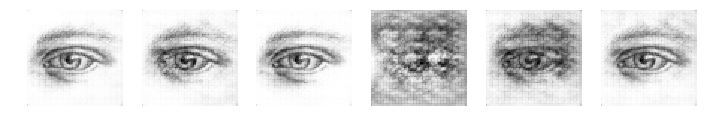

Epoch 169, G_loss: 4.157, D_loss = 0.233


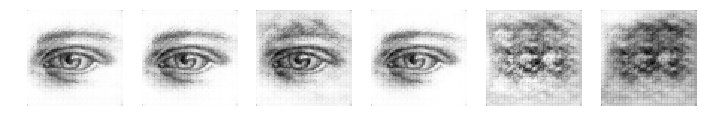

Epoch 170, G_loss: 5.419, D_loss = 0.139


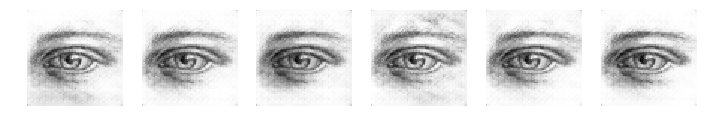

Epoch 171, G_loss: 4.406, D_loss = 0.275


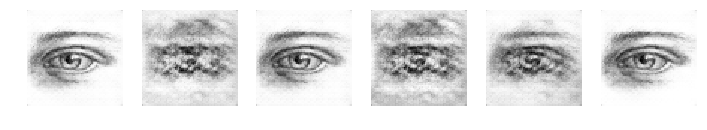

Epoch 172, G_loss: 5.126, D_loss = 0.176


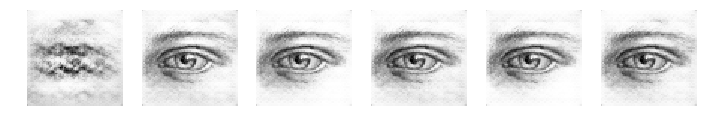

Epoch 173, G_loss: 6.189, D_loss = 0.167


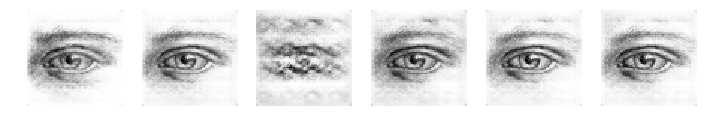

Epoch 174, G_loss: 4.701, D_loss = 0.119


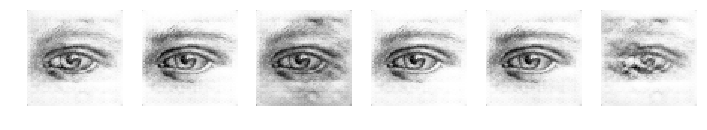

Epoch 175, G_loss: 3.999, D_loss = 0.268


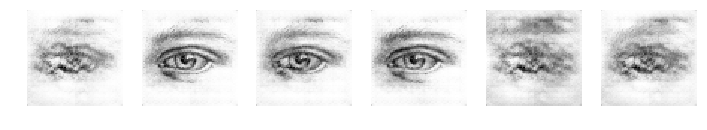

Epoch 176, G_loss: 5.251, D_loss = 0.210


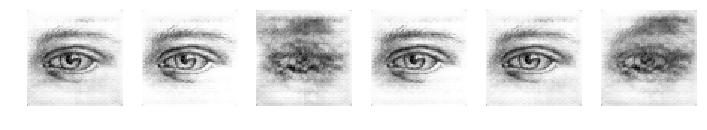

Epoch 177, G_loss: 5.145, D_loss = 0.551


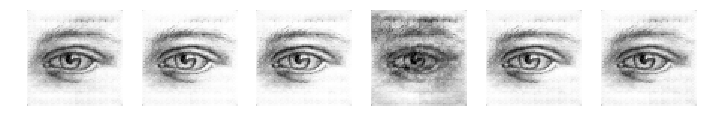

Epoch 178, G_loss: 5.038, D_loss = 0.109


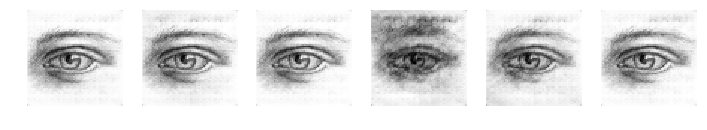

Epoch 179, G_loss: 4.512, D_loss = 0.502


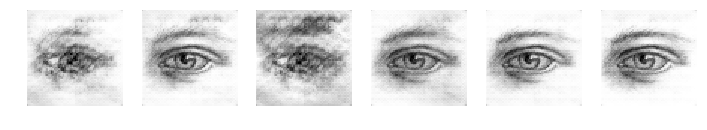

Epoch 180, G_loss: 7.563, D_loss = 0.115


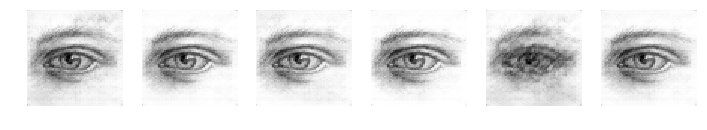

Epoch 181, G_loss: 4.159, D_loss = 0.139


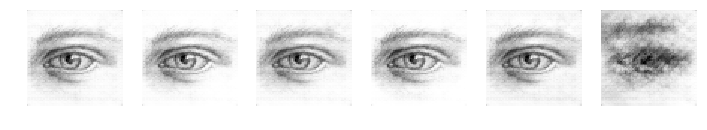

Epoch 182, G_loss: 3.686, D_loss = 0.362


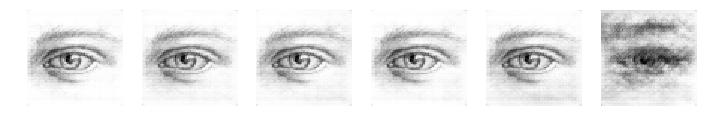

Epoch 183, G_loss: 5.073, D_loss = 0.092


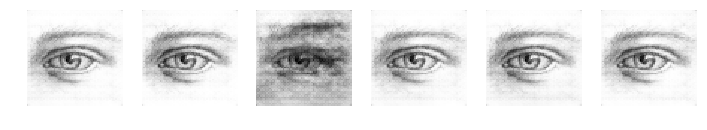

Epoch 184, G_loss: 5.113, D_loss = 0.085


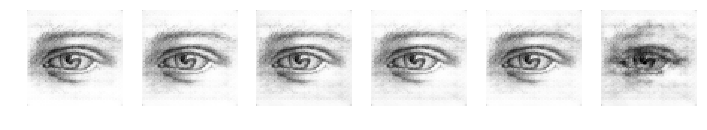

Epoch 185, G_loss: 3.334, D_loss = 0.488


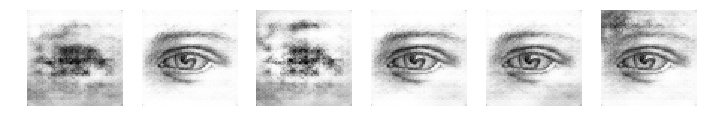

Epoch 186, G_loss: 6.839, D_loss = 0.236


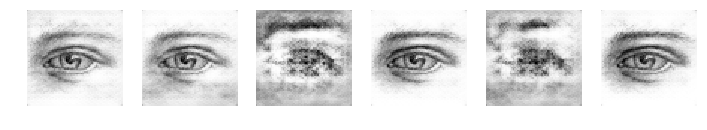

Epoch 187, G_loss: 6.177, D_loss = 0.141


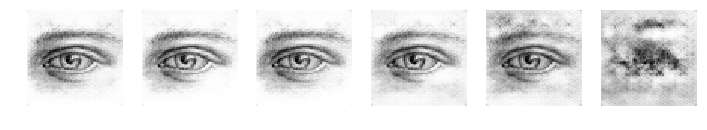

Epoch 188, G_loss: 4.251, D_loss = 0.389


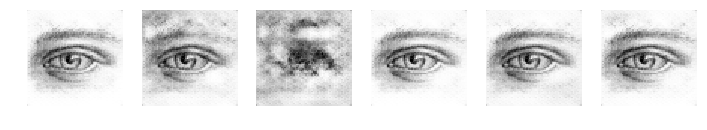

Epoch 189, G_loss: 5.367, D_loss = 0.356


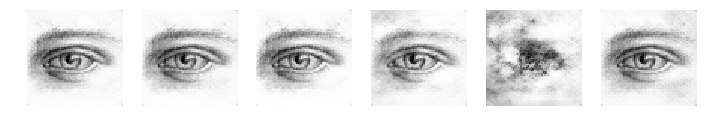

Epoch 190, G_loss: 4.792, D_loss = 0.248


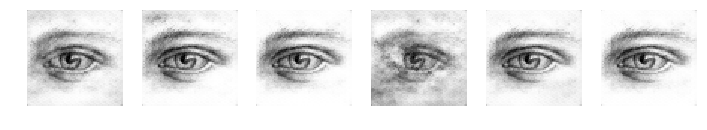

Epoch 191, G_loss: 4.298, D_loss = 0.959


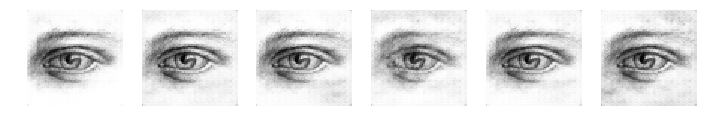

Epoch 192, G_loss: 4.027, D_loss = 0.166


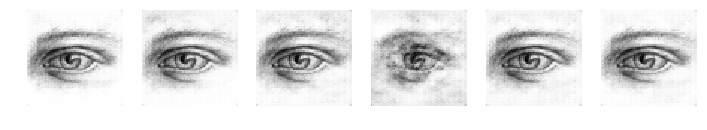

Epoch 193, G_loss: 4.311, D_loss = 0.303


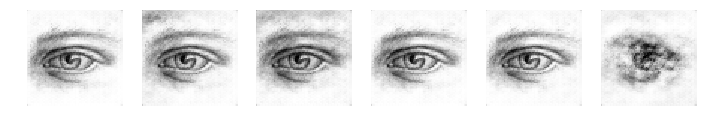

Epoch 194, G_loss: 3.017, D_loss = 0.416


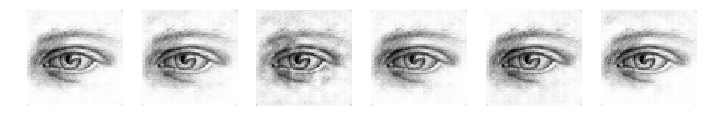

Epoch 195, G_loss: 4.671, D_loss = 0.156


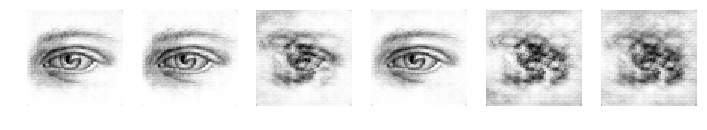

Epoch 196, G_loss: 3.656, D_loss = 0.203


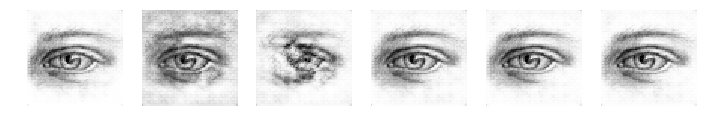

Epoch 197, G_loss: 3.672, D_loss = 0.263


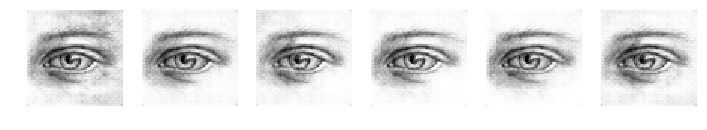

Epoch 198, G_loss: 3.944, D_loss = 0.156


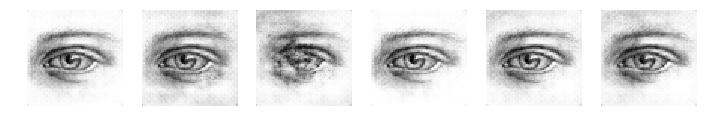

In [ ]:
# record time used
from time import time
start_time = time()
G_log, D_log = train(epoch_max, batch_size)
elapsed_time = time() - start_time
print('Total time used: %d seconds' % elapsed_time)

In [25]:
def plot_learning_curve(G_log, D_log):
    plt.figure(figsize=(10, 6))
    plt.plot(G_log, color='green',  linewidth=2.5, linestyle='-', label='G loss')
    plt.plot(D_log, color='yellow', linewidth=2.5, linestyle='-', label='D loss')
    plt.legend(loc='upper right',frameon=True)
    return

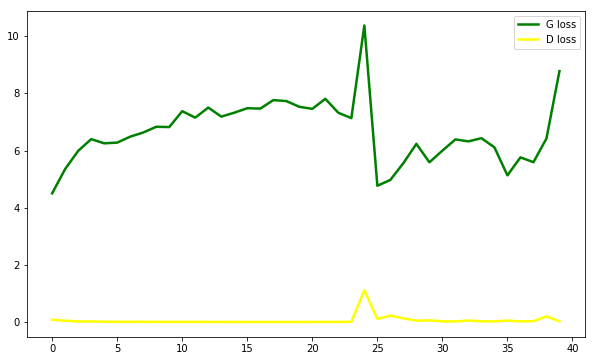

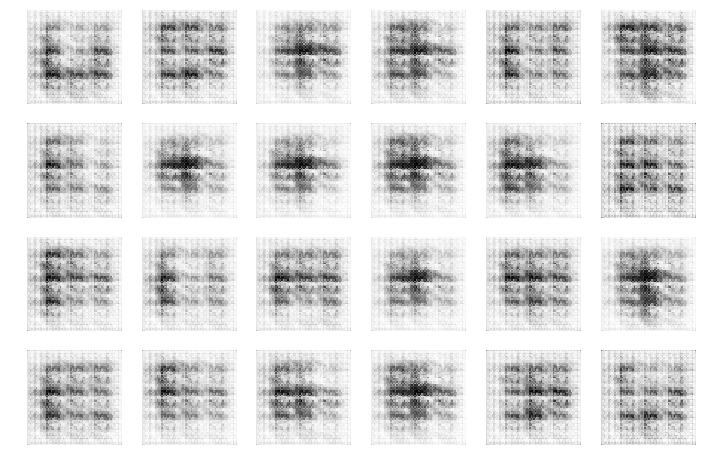

In [26]:
plot_learning_curve(G_log, D_log)
plot_fake_images(4, 6)

In [27]:
torch.save(G.state_dict(), 'G_chk_200.pt')
torch.save(D.state_dict(), 'D_chk_200.pt')

In [6]:
G_net = Generator()
D_net = Discriminator()

G_net.load_state_dict(torch.load('G_chk_200.pt'))
D_net.load_state_dict(torch.load('D_chk_200.pt'))

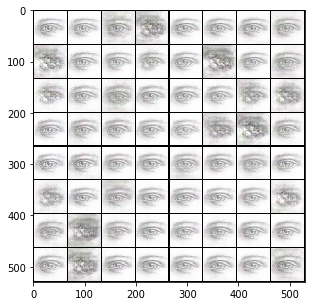

In [7]:
from torchvision.utils import make_grid
noise = torch.randn(64,100,1,1)
noise = Variable(noise)
fake_u=G_net(noise)
imgs = make_grid(fake_u.data*0.5+0.5)# CHW
plt.figure(figsize=(5,5))
plt.imshow(imgs.permute(1,2,0).numpy()) # HWC
plt.show()